In [1]:
using DifferentialEquations
using Plots
using Makie
using Dierckx
using AbstractFFTs
using FFTW
gr(fmt = :png)

Plots.GRBackend()

In [2]:
function diff_eq(du, u, p, t)
    a = p[1]
    w = p[2]
    t0 = p[3]
    s = p[4]
    du[1] = -u[2] + a*cos(w*t)*u[2]*e^(-(t-t0)^2/(2*s^2))
    du[2] = u[1]
end

diff_eq (generic function with 1 method)

┌ Warning: `binary_minheap(xs::AbstractVector{T}) where T` is deprecated, use `BinaryMinHeap(xs)` instead.
│   caller = tstop_saveat_disc_handling at solve.jl:371 [inlined]
└ @ Core C:\Users\Vojta\.julia\packages\OrdinaryDiffEq\NS3ps\src\solve.jl:371
┌ Warning: `binary_minheap(xs::AbstractVector{T}) where T` is deprecated, use `BinaryMinHeap(xs)` instead.
│   caller = #__init#203(::Int64, ::Array{Float64,1}, ::Array{Float64,1}, ::Array{Float64,1}, ::Nothing, ::Bool, ::Nothing, ::Bool, ::Bool, ::Nothing, ::Bool, ::Bool, ::Float64, ::Bool, ::Rational{Int64}, ::Nothing, ::Nothing, ::Int64, ::Rational{Int64}, ::Int64, ::Int64, ::Rational{Int64}, ::Bool, ::Int64, ::Nothing, ::Nothing, ::Int64, ::Float64, ::Float64, ::typeof(DiffEqBase.ODE_DEFAULT_NORM), ::typeof(LinearAlgebra.opnorm), ::typeof(DiffEqBase.ODE_DEFAULT_ISOUTOFDOMAIN), ::typeof(DiffEqBase.ODE_DEFAULT_UNSTABLE_CHECK), ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Int64, ::String, ::typeof(DiffEqBase.ODE_DEFAU

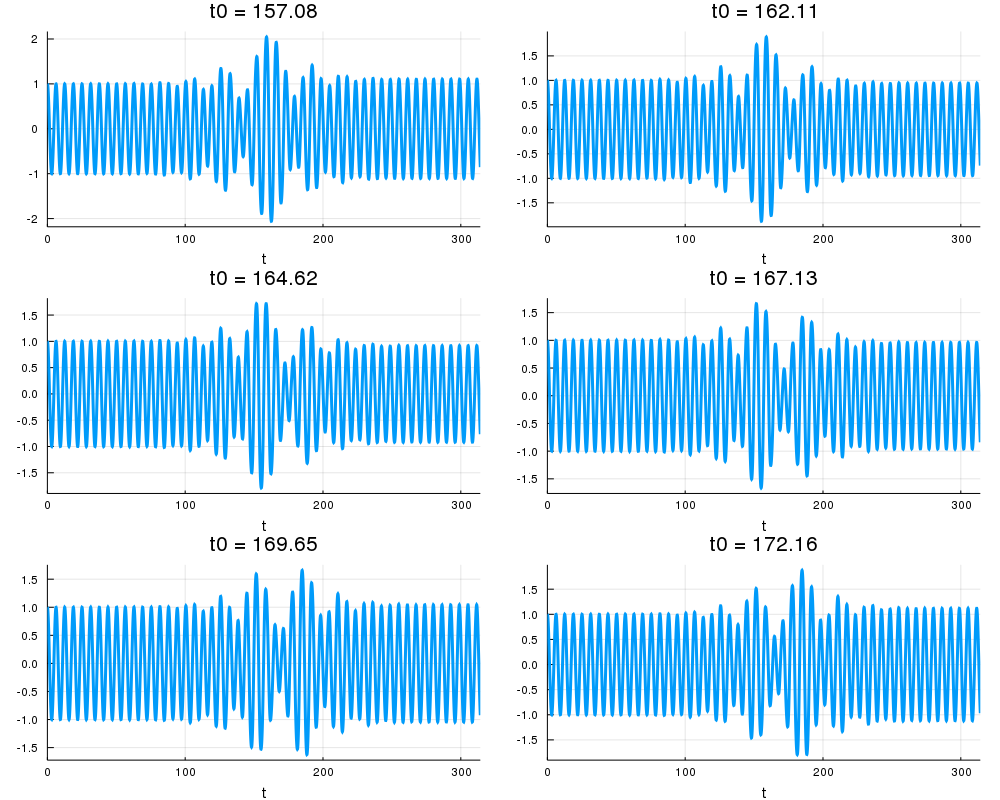

In [3]:
u0 = [0.0;1.0]
tspan = (0.0,2*pi*50.0)
p0 = [0.5, 1.7, 2*pi*0.4, tspan[2]/10]
p = deepcopy(p0)
p[3] = tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p1 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

p[3] = p0[3]*2 + tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p2 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

p[3] = p0[3]*3 + tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p3 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

p[3] = p0[3]*4 + tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p4 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

p[3] = p0[3]*5 + tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p5 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

p[3] = p0[3]*6 + tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol = solve(prob)
p6 = Plots.plot(sol, vars = (0,2), title = "t0 = $(round(p[3], digits = 2))")

Plots.plot(p1, p2, p3, p4, p5, p6, layout = @layout([a b; c d; e f]), legend = :none, size = (1000,800))

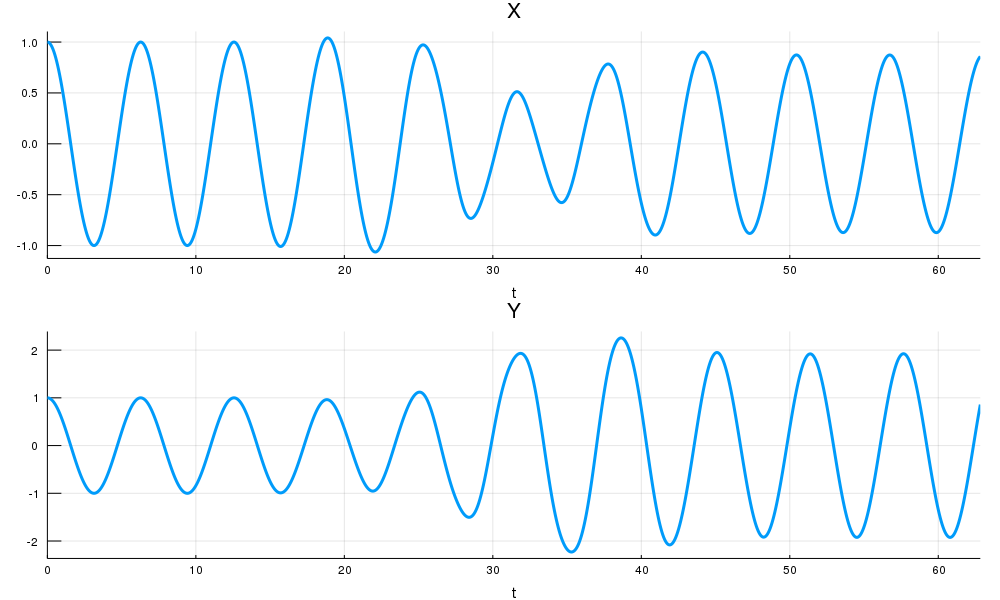

In [4]:
u0 = [0.0;1.0]
tspan = (0.0,2*pi*10.0)
p0 = [0.5, 1.7, 2*pi*0.4, tspan[2]/10]
p = deepcopy(p0)
p[3] = tspan[2]/2
prob = ODEProblem(diff_eq,u0,tspan,p)
sol1 = solve(prob)
p1 = Plots.plot(sol1, vars = (0,2), title = "X")



p[1] = -p0[1]
prob = ODEProblem(diff_eq,u0,tspan,p)
sol2 = solve(prob)
p2 = Plots.plot(sol2, vars = (0,2), title = "Y")

Plots.plot(p1, p2, layout = (2, 1), legend = :none, size = (1000, 600))

In [5]:
sol1_arr = [sol1[2, i] for i = 1:size(sol1,2)]
sol1_t = [sol1.t[i] for i = 1:size(sol1,2)]
spl1 = Spline1D(sol1_t, sol1_arr)

Spline1D(knots=[0.0,0.010989 … 61.9328,62.8319] (83 elements), k=3, extrapolation="nearest", residual=0.0)

In [6]:
sol2_arr = [sol2[2, i] for i = 1:size(sol2,2)]
sol2_t = [sol2.t[i] for i = 1:size(sol2,2)]
spl2 = Spline1D(sol2_t, sol2_arr)

Spline1D(knots=[0.0,0.010989 … 61.8094,62.8319] (81 elements), k=3, extrapolation="nearest", residual=0.0)

In [ ]:
scene = Scene(resolution = (1000, 1000))

ff(t,s) = (spl1(t)*cos(s), spl2(t)*sin(s))
time = Node(0.0)
limits = FRect(-2.5, -2.5, 5, 5)
p1 = lines!(scene, lift(t-> ff.(t, range(0, stop = 2pi, length = 300)), time), color = :blue, linewidth = 3, limits = limits)
N = 1000
record(scene, "D:\\Documents\\Diplomka\\Animations\\string_grav_wave_bulk.gif", range(tspan[1], stop = tspan[2], length = N)) do i
    push!(time, i)
    sleep(1/120)
end

┌ Warning: `a::Number + b::AbstractArray` is deprecated, use `a .+ b` instead.
│   caller = top-level scope at In[11]:2
└ @ Core In[11]:2
┌ Warning: `a::Number + b::AbstractArray` is deprecated, use `a .+ b` instead.
│   caller = top-level scope at In[11]:3
└ @ Core In[11]:3


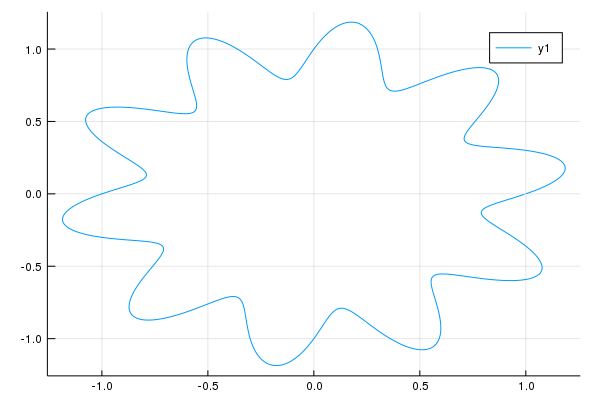

In [11]:
s = 0:0.01:2*pi
x = cos.(s) .* (1+0.2*sin.(10*s))
y = sin.(s) .* (1+0.2*sin.(10*s))

Plots.plot(x,y)

In [12]:
fft_x = AbstractFFTs.fft(x)
fft_y = AbstractFFTs.fft(y)

629-element Array{Complex{Float64},1}:
 -0.0010879740112677665 + 0.0im                 
       1.06906046050439 - 314.32711218292746im  
  -0.002978798720890194 + 0.4551281358481432im  
 -0.0006667998284314008 + 0.2559094320379902im  
   0.002805084393998904 + 0.18201103348229758im 
   0.009119975854238085 + 0.14232484023694317im 
   0.022048505691115525 + 0.11744341267933821im 
   0.054090389055454755 + 0.10082384485272188im 
    0.17422755541168233 + 0.09142536966222345im 
      31.23880937447139 + 1.0340384333986559im  
    -0.6854252894670809 + 0.04563214948111638im 
     -31.57985496673851 - 1.1203069554869074im  
    0.27165420288783493 + 0.06842169418933583im 
                        ⋮                       
      0.271654202887846 - 0.06842169418933258im 
     -31.57985496673851 + 1.1203069554868965im  
    -0.6854252894670925 - 0.045632149481119474im
     31.238809374471373 - 1.0340384333986563im  
     0.1742275554116705 - 0.09142536966222703im 
    0.05409038905546483 - 0.10

In [77]:
function diff_eq1(du, u, p, t)
    a = p[1]
    w = p[2]
    t0 = p[3]
    s = p[4]
    n = p[5]
    du[1] = -n^2*u[2]
    du[2] = u[1]
end

diff_eq1 (generic function with 1 method)

In [78]:
function diff_eq2(du, u, p, t)
    a = p[1]
    w = p[2]
    t0 = p[3]
    s = p[4]
    n = p[5]
    du[1] = -n^2*u[2] + a*cos(w*t)*u[2]*e^(-(t-t0)^2/(2*s^2))
    du[2] = u[1]
end

diff_eq2 (generic function with 1 method)

In [118]:
res = Array{Any, 1}(undef, 0)
u0 = [0.0;1.0]
tspan = (0.0,0.1)

for n = 0:size(fft_x,1)

    px = [0.5, 1.7, 2*pi*0.4, tspan[2]/2, n]
    py = [-0.5, 1.7, 2*pi*0.4, tspan[2]/2, n]

    probx = ODEProblem(diff_eq1,u0,tspan,px)
    solx = solve(probx)
    
    solx_arr = [solx[2, i] for i = 1:size(solx,2)]
    solx_t = [solx.t[i] for i = 1:size(solx,2)]
    splx = Spline1D(solx_t, solx_arr)

    proby = ODEProblem(diff_eq1,u0,tspan,py)
    soly = solve(proby)
    
    soly_arr = [soly[2, i] for i = 1:size(soly,2)]
    soly_t = [soly.t[i] for i = 1:size(soly,2)]
    sply = Spline1D(soly_t, soly_arr)
    
    push!(res, (splx, sply))
    
end
    

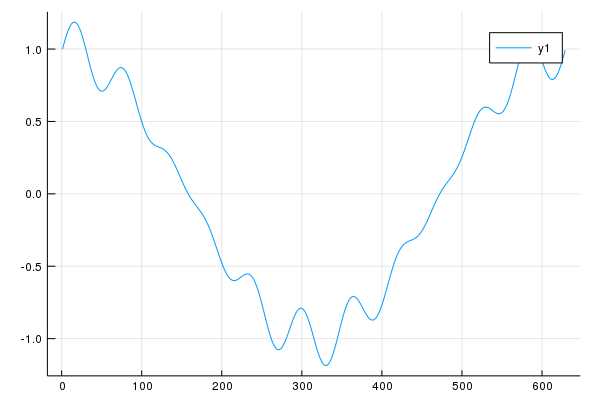

In [119]:
Plots.plot(x)

In [120]:
fx =[real(ifft([fft_x[n] * res[n][1](t) for n = 1:size(fft_x,1)])) for t = tspan[1]:tspan[2]/1000:tspan[2]]
fy =[real(ifft([fft_y[n] * res[n][2](t) for n = 1:size(fft_y,1)])) for t = tspan[1]:tspan[2]/1000:tspan[2]];

In [121]:
scene = Scene(resolution = (1000, 1000))

time = Node(1)
limits = FRect(-2.5, -2.5, 5, 5)
p1 = lines!(scene, lift(t-> [(fx[t][s], fy[t][s]) for s = 1:size(fx[t],1)], time), color = :blue, linewidth = 3, limits = limits)
N = 1000
record(scene, "D:\\Documents\\Diplomka\\Animations\\string_grav_wave_bulk.gif", 1:size(fx,1)) do i
    push!(time, i)
    sleep(1/120)
end

"D:\\Documents\\Diplomka\\Animations\\string_grav_wave_bulk.gif"